In [10]:
import xgboost as xgb
import shap
import numpy as np
import anndata as ad
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import wandb
from wandb.integration.xgboost import WandbCallback
wandb_project = "xgboost-feature-importance-target2"

adata = ad.read("/home/icb/tim.treis/projects/2024_JUMP_CellProfiler/data/target2_wellres_featuresimputed_druginfoadded_pycytominer.h5ad")
adata

/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/anndata/__init__.py:55: FutureWarning:

`anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.



AnnData object with n_obs × n_vars = 64464 × 591
    obs: 'Metadata_Source', 'Metadata_Plate', 'Metadata_Well', 'Metadata_Batch', 'Metadata_JCP2022', 'Metadata_InChIKey', 'Metadata_InChI', 'Metadata_InChIKey_standardized', 'Metadata_SMILES_standardized', 'Metadata_InChI_standardized', 'Metadata_pubchem_cid', 'Metadata_pert_iname', 'Metadata_clinical_phase', 'Metadata_target', 'Metadata_disease_area', 'Metadata_indication', 'Metadata_moa', 'Metadata_Microscope_Name', 'Metadata_Widefield_vs_Confocal', 'Metadata_Excitation_Type', 'Metadata_Objective_NA', 'Metadata_N_Brightfield_Planes_Min', 'Metadata_N_Brightfield_Planes_Max', 'Metadata_Distance_Between_Z_Microns', 'Metadata_Sites_Per_Well', 'Metadata_Filter_Configuration'
    uns: 'Metadata_Source_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

## Setup

In [2]:
X = adata.X  

y = adata.obs["Metadata_InChIKey"].values  
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

xgb_params = {
    "objective": "multi:softprob",  # For multiclass classification (probability output)
    "num_class": len(np.unique(y_encoded)),  # Number of unique labels/classes
    "learning_rate": 0.1,  # Set a low learning rate
    "max_depth": 3,  # Control overfitting with max depth
    "tree_method": "gpu_hist",  # Use GPU-accelerated training
    "predictor": "gpu_predictor",  # GPU predictor for inference (optional)
    "lambda": 2.0,  # L2 regularization
    "alpha": 1.0,   # L1 regularization
}

# Stratify by drugs
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

We know that the validation loss pretty much plateous around epoch 150, so we'll only train until then (assuming most of what happens after that is overfitting).

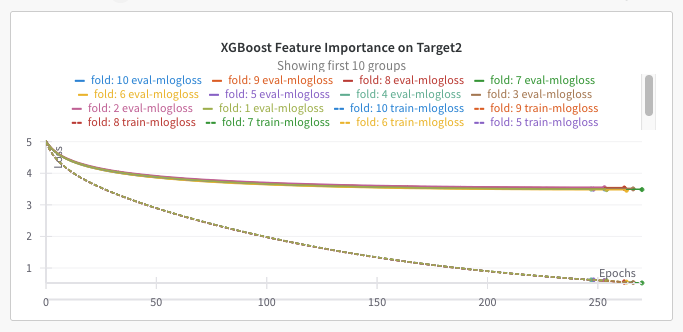

In [6]:
epochs = 150

In [7]:
fold_importances = []


for fold, (train_index, test_index) in enumerate(kf.split(X, y_encoded)):
    # Initialize wandb run for this fold
    wandb.init(
        project=wandb_project,
        config=xgb_params,
        reinit=True,  # Allows re-initialization in loops
        name=f"Fold_{fold+1}",
        group="CrossValidation"  # Groups all folds under one group
    )
    
    # Add fold number to config
    wandb.config.update({'fold': fold + 1})
    
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y_encoded[train_index], y_encoded[test_index]

    dtrain = xgb.DMatrix(X_train, label=y_train)
    dval = xgb.DMatrix(X_test, label=y_test)
    evals = [(dtrain, 'train'), (dval, 'eval')]

    # Train the model with WandbCallback
    bst = xgb.train(
        params=xgb_params,
        dtrain=dtrain,
        num_boost_round=epochs,
        evals=evals,
        early_stopping_rounds=10,
        verbose_eval=10,
        callbacks=[WandbCallback(
            log_feature_importance=True,
            define_metric=['eval/mlogloss', 'train/mlogloss']
        )]
    )

    # Get feature importance from the trained booster
    importance = bst.get_score(importance_type='weight')
    fold_importance = np.array([importance.get(f"f{i}", 0) for i in range(X.shape[1])])
    fold_importances.append(fold_importance)
    
    # Log feature importance to wandb
    feature_names = adata.var_names
    importance_df = pd.DataFrame({
        'feature': feature_names,
        'importance': fold_importance
    })
    importance_df.set_index('feature', inplace=True, drop=False)
    importance_df = importance_df.sort_values(by='importance', ascending=False)
    wandb.log({"feature_importance": wandb.Table(dataframe=importance_df)})
    wandb.log({"feature_importance_plot": wandb.plot.bar(
        wandb.Table(dataframe=importance_df),
        "feature", "importance",
        title="Feature Importance"
    )})
    
    wandb.finish()

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: ttreis (catchall). Use `wandb login --relogin` to force relogin


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:56:25] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:56:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99897	eval-mlogloss:5.05197
[10]	train-mlogloss:4.12426	eval-mlogloss:4.43698
[20]	train-mlogloss:3.70553	eval-mlogloss:4.20014
[30]	train-mlogloss:3.39385	eval-mlogloss:4.05558
[40]	train-mlogloss:3.13080	eval-mlogloss:3.95243
[50]	train-mlogloss:2.89741	eval-mlogloss:3.87343
[60]	train-mlogloss:2.68457	eval-mlogloss:3.81074
[70]	train-mlogloss:2.48937	eval-mlogloss:3.75868
[80]	train-mlogloss:2.30838	eval-mlogloss:3.71301
[90]	train-mlogloss:2.13941	eval-mlogloss:3.67797
[100]	train-mlogloss:1.98145	eval-mlogloss:3.64675
[110]	train-mlogloss:1.83411	eval-mlogloss:3.62153
[120]	train-mlogloss:1.69696	eval-mlogloss:3.59910
[130]	train-mlogloss:1.56874	eval-mlogloss:3.57972
[140]	train-mlogloss:1.44954	eval-mlogloss:3.56029
[149]	train-mlogloss:1.35021	eval-mlogloss:3.54755


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:58:06] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
eval-mlogloss,█▇▇▆▅▅▅▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
train-mlogloss,██▇▇▇▇▆▆▆▆▆▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
best_iteration,149
best_score,3.54755
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:58:17] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:58:17] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99661	eval-mlogloss:5.05375
[10]	train-mlogloss:4.11947	eval-mlogloss:4.45369
[20]	train-mlogloss:3.70062	eval-mlogloss:4.22322
[30]	train-mlogloss:3.38789	eval-mlogloss:4.08072
[40]	train-mlogloss:3.12476	eval-mlogloss:3.98175
[50]	train-mlogloss:2.89137	eval-mlogloss:3.90678
[60]	train-mlogloss:2.67820	eval-mlogloss:3.84728
[70]	train-mlogloss:2.48197	eval-mlogloss:3.79811
[80]	train-mlogloss:2.30060	eval-mlogloss:3.75968
[90]	train-mlogloss:2.13187	eval-mlogloss:3.72409
[100]	train-mlogloss:1.97423	eval-mlogloss:3.69455
[110]	train-mlogloss:1.82787	eval-mlogloss:3.66921
[120]	train-mlogloss:1.68993	eval-mlogloss:3.64874
[130]	train-mlogloss:1.56192	eval-mlogloss:3.62921
[140]	train-mlogloss:1.44322	eval-mlogloss:3.61237
[149]	train-mlogloss:1.34355	eval-mlogloss:3.59961


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:59:57] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇████
eval-mlogloss,█▇▆▆▆▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train-mlogloss,██▇▇▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
best_iteration,149
best_score,3.59961
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:00:04] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:00:04] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99702	eval-mlogloss:5.04568
[10]	train-mlogloss:4.12309	eval-mlogloss:4.43855
[20]	train-mlogloss:3.70517	eval-mlogloss:4.20660
[30]	train-mlogloss:3.39300	eval-mlogloss:4.06348
[40]	train-mlogloss:3.12990	eval-mlogloss:3.96197
[50]	train-mlogloss:2.89637	eval-mlogloss:3.88622
[60]	train-mlogloss:2.68415	eval-mlogloss:3.82565
[70]	train-mlogloss:2.48878	eval-mlogloss:3.77371
[80]	train-mlogloss:2.30752	eval-mlogloss:3.73178
[90]	train-mlogloss:2.13771	eval-mlogloss:3.69383
[100]	train-mlogloss:1.98029	eval-mlogloss:3.66366
[110]	train-mlogloss:1.83254	eval-mlogloss:3.63814
[120]	train-mlogloss:1.69512	eval-mlogloss:3.61689
[130]	train-mlogloss:1.56634	eval-mlogloss:3.59910
[140]	train-mlogloss:1.44791	eval-mlogloss:3.58399
[149]	train-mlogloss:1.34839	eval-mlogloss:3.57051


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:01:44] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█████
eval-mlogloss,█▆▆▅▅▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train-mlogloss,██▇▇▇▇▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁
best_iteration,149
best_score,3.57051
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:01:51] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:01:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99936	eval-mlogloss:5.04465
[10]	train-mlogloss:4.12151	eval-mlogloss:4.43058
[20]	train-mlogloss:3.70257	eval-mlogloss:4.19450
[30]	train-mlogloss:3.38992	eval-mlogloss:4.05048
[40]	train-mlogloss:3.12683	eval-mlogloss:3.94922
[50]	train-mlogloss:2.89217	eval-mlogloss:3.87259
[60]	train-mlogloss:2.67940	eval-mlogloss:3.81204
[70]	train-mlogloss:2.48433	eval-mlogloss:3.76269
[80]	train-mlogloss:2.30230	eval-mlogloss:3.72209
[90]	train-mlogloss:2.13359	eval-mlogloss:3.68733
[100]	train-mlogloss:1.97576	eval-mlogloss:3.65720
[110]	train-mlogloss:1.82832	eval-mlogloss:3.62931
[120]	train-mlogloss:1.69092	eval-mlogloss:3.60772
[130]	train-mlogloss:1.56342	eval-mlogloss:3.58880
[140]	train-mlogloss:1.44425	eval-mlogloss:3.57263
[149]	train-mlogloss:1.34465	eval-mlogloss:3.55804


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:03:31] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇████
eval-mlogloss,█▇▆▆▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train-mlogloss,█▇▇▇▆▆▅▅▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁
best_iteration,149
best_score,3.55804
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:03:39] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:03:39] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:5.00013	eval-mlogloss:5.04663
[10]	train-mlogloss:4.12338	eval-mlogloss:4.43030
[20]	train-mlogloss:3.70496	eval-mlogloss:4.19476
[30]	train-mlogloss:3.39323	eval-mlogloss:4.04770
[40]	train-mlogloss:3.12935	eval-mlogloss:3.94559
[50]	train-mlogloss:2.89636	eval-mlogloss:3.86892
[60]	train-mlogloss:2.68443	eval-mlogloss:3.80648
[70]	train-mlogloss:2.48994	eval-mlogloss:3.75719
[80]	train-mlogloss:2.30891	eval-mlogloss:3.71640
[90]	train-mlogloss:2.14002	eval-mlogloss:3.68029
[100]	train-mlogloss:1.98262	eval-mlogloss:3.65107
[110]	train-mlogloss:1.83578	eval-mlogloss:3.62632
[120]	train-mlogloss:1.69872	eval-mlogloss:3.60328
[130]	train-mlogloss:1.57048	eval-mlogloss:3.58505
[140]	train-mlogloss:1.45145	eval-mlogloss:3.56833
[149]	train-mlogloss:1.35185	eval-mlogloss:3.55609


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:05:18] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
eval-mlogloss,█▇▅▄▄▄▄▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train-mlogloss,███▇▇▆▆▆▅▅▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
best_iteration,149
best_score,3.55609
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:05:29] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:05:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99984	eval-mlogloss:5.04598
[10]	train-mlogloss:4.12465	eval-mlogloss:4.41534
[20]	train-mlogloss:3.70665	eval-mlogloss:4.17475
[30]	train-mlogloss:3.39483	eval-mlogloss:4.02665
[40]	train-mlogloss:3.13255	eval-mlogloss:3.92308
[50]	train-mlogloss:2.89921	eval-mlogloss:3.84342
[60]	train-mlogloss:2.68710	eval-mlogloss:3.78047
[70]	train-mlogloss:2.49128	eval-mlogloss:3.72783
[80]	train-mlogloss:2.30918	eval-mlogloss:3.68611
[90]	train-mlogloss:2.13962	eval-mlogloss:3.65149
[100]	train-mlogloss:1.98195	eval-mlogloss:3.62205
[110]	train-mlogloss:1.83437	eval-mlogloss:3.59737
[120]	train-mlogloss:1.69743	eval-mlogloss:3.57469
[130]	train-mlogloss:1.56919	eval-mlogloss:3.55534
[140]	train-mlogloss:1.44996	eval-mlogloss:3.53948
[149]	train-mlogloss:1.35001	eval-mlogloss:3.52606


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:07:09] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
eval-mlogloss,█▇▆▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train-mlogloss,██▇▇▇▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁
best_iteration,149
best_score,3.52606
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:07:18] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:07:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99756	eval-mlogloss:5.04977
[10]	train-mlogloss:4.12549	eval-mlogloss:4.42005
[20]	train-mlogloss:3.70784	eval-mlogloss:4.18152
[30]	train-mlogloss:3.39585	eval-mlogloss:4.03400
[40]	train-mlogloss:3.13276	eval-mlogloss:3.93101
[50]	train-mlogloss:2.89889	eval-mlogloss:3.85355
[60]	train-mlogloss:2.68690	eval-mlogloss:3.79319
[70]	train-mlogloss:2.49084	eval-mlogloss:3.74428
[80]	train-mlogloss:2.31012	eval-mlogloss:3.70301
[90]	train-mlogloss:2.14073	eval-mlogloss:3.66814
[100]	train-mlogloss:1.98280	eval-mlogloss:3.63892
[110]	train-mlogloss:1.83549	eval-mlogloss:3.61212
[120]	train-mlogloss:1.69808	eval-mlogloss:3.59028
[130]	train-mlogloss:1.57003	eval-mlogloss:3.57132
[140]	train-mlogloss:1.45068	eval-mlogloss:3.55462
[149]	train-mlogloss:1.35063	eval-mlogloss:3.54154


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:08:57] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇█████
eval-mlogloss,█▇▆▆▆▆▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train-mlogloss,█▇▇▆▆▆▅▅▅▅▄▄▄▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
best_iteration,149
best_score,3.54154
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:09:08] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:09:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99834	eval-mlogloss:5.05006
[10]	train-mlogloss:4.12097	eval-mlogloss:4.43558
[20]	train-mlogloss:3.70269	eval-mlogloss:4.20170
[30]	train-mlogloss:3.39028	eval-mlogloss:4.05813
[40]	train-mlogloss:3.12770	eval-mlogloss:3.95928
[50]	train-mlogloss:2.89401	eval-mlogloss:3.88322
[60]	train-mlogloss:2.68138	eval-mlogloss:3.82289
[70]	train-mlogloss:2.48489	eval-mlogloss:3.77268
[80]	train-mlogloss:2.30333	eval-mlogloss:3.73268
[90]	train-mlogloss:2.13359	eval-mlogloss:3.69833
[100]	train-mlogloss:1.97560	eval-mlogloss:3.66820
[110]	train-mlogloss:1.82859	eval-mlogloss:3.64263
[120]	train-mlogloss:1.69101	eval-mlogloss:3.62192
[130]	train-mlogloss:1.56309	eval-mlogloss:3.60449
[140]	train-mlogloss:1.44367	eval-mlogloss:3.58937
[149]	train-mlogloss:1.34390	eval-mlogloss:3.57791


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:10:48] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇███
eval-mlogloss,█▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
train-mlogloss,██▇▇▇▆▆▅▅▅▅▅▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
best_iteration,149
best_score,3.57791
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:10:55] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:10:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99854	eval-mlogloss:5.04862
[10]	train-mlogloss:4.12195	eval-mlogloss:4.43855
[20]	train-mlogloss:3.70210	eval-mlogloss:4.20600
[30]	train-mlogloss:3.38927	eval-mlogloss:4.06502
[40]	train-mlogloss:3.12548	eval-mlogloss:3.96674
[50]	train-mlogloss:2.89124	eval-mlogloss:3.89057
[60]	train-mlogloss:2.67824	eval-mlogloss:3.83059
[70]	train-mlogloss:2.48186	eval-mlogloss:3.78271
[80]	train-mlogloss:2.30063	eval-mlogloss:3.74172
[90]	train-mlogloss:2.13136	eval-mlogloss:3.70766
[100]	train-mlogloss:1.97394	eval-mlogloss:3.67966
[110]	train-mlogloss:1.82670	eval-mlogloss:3.65352
[120]	train-mlogloss:1.68938	eval-mlogloss:3.63208
[130]	train-mlogloss:1.56173	eval-mlogloss:3.61227
[140]	train-mlogloss:1.44268	eval-mlogloss:3.59721
[149]	train-mlogloss:1.34340	eval-mlogloss:3.58505


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:12:35] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
eval-mlogloss,██▇▆▆▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train-mlogloss,█▆▅▅▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
best_iteration,149
best_score,3.58505
epoch,149


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:12:44] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)
/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:12:44] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-mlogloss:4.99959	eval-mlogloss:5.04696
[10]	train-mlogloss:4.12252	eval-mlogloss:4.43133
[20]	train-mlogloss:3.70552	eval-mlogloss:4.19503
[30]	train-mlogloss:3.39361	eval-mlogloss:4.05258
[40]	train-mlogloss:3.13040	eval-mlogloss:3.95281
[50]	train-mlogloss:2.89701	eval-mlogloss:3.87466
[60]	train-mlogloss:2.68421	eval-mlogloss:3.81550
[70]	train-mlogloss:2.48902	eval-mlogloss:3.76437
[80]	train-mlogloss:2.30749	eval-mlogloss:3.72176
[90]	train-mlogloss:2.13737	eval-mlogloss:3.68557
[100]	train-mlogloss:1.97985	eval-mlogloss:3.65626
[110]	train-mlogloss:1.83182	eval-mlogloss:3.63153
[120]	train-mlogloss:1.69468	eval-mlogloss:3.61041
[130]	train-mlogloss:1.56700	eval-mlogloss:3.59223
[140]	train-mlogloss:1.44779	eval-mlogloss:3.57543
[149]	train-mlogloss:1.34778	eval-mlogloss:3.56336


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [21:14:24] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


best_iteration,▁
best_score,▁
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇██
eval-mlogloss,█▆▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train-mlogloss,██▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
best_iteration,149
best_score,3.56336
epoch,149


## Collect results

In [28]:
fold_importances_df = pd.DataFrame(fold_importances).T
fold_importances_df.index = adata.var_names
fold_importances_df.columns = [f"fold_{i+1}" for i in range(fold_importances_df.shape[1])]
fold_importances_df

,fold_1,fold_2,fold_3,fold_4,fold_5,fold_6,fold_7,fold_8,fold_9,fold_10
Cells_AreaShape_BoundingBoxMaximum_X,338.0,351.0,342.0,312.0,285.0,304.0,359.0,326.0,289.0,315.0
Cells_AreaShape_Eccentricity,645.0,667.0,644.0,630.0,611.0,634.0,619.0,607.0,613.0,628.0
Cells_AreaShape_Extent,469.0,524.0,492.0,548.0,550.0,478.0,536.0,528.0,528.0,555.0
Cells_AreaShape_FormFactor,341.0,340.0,334.0,339.0,372.0,405.0,343.0,385.0,348.0,355.0
Cells_AreaShape_Orientation,497.0,459.0,509.0,496.0,457.0,486.0,542.0,468.0,464.0,520.0
...,...,...,...,...,...,...,...,...,...,...
Nuclei_Texture_InverseDifferenceMoment_RNA_10_03_256,319.0,347.0,318.0,325.0,317.0,329.0,305.0,318.0,284.0,302.0
Nuclei_Texture_SumEntropy_AGP_10_01_256,349.0,395.0,322.0,356.0,358.0,309.0,370.0,375.0,320.0,370.0
Nuclei_Texture_SumVariance_AGP_10_01_256,625.0,624.0,610.0,570.0,583.0,548.0,606.0,628.0,567.0,587.0
Nuclei_Texture_SumVariance_ER_10_01_256,398.0,403.0,396.0,428.0,386.0,433.0,425.0,429.0,412.0,425.0


In [29]:
fold_importances_df.to_csv("average_importance.csv")

## Visualise

In [3]:
import plotly.express as px

fold_importances_df = pd.read_csv("average_importance.csv", index_col=0)

In [4]:
fold_importances_long = fold_importances_df.reset_index().melt(id_vars='index', var_name='fold', value_name='importance')
fold_importances_long.rename(columns={'index': 'feature'}, inplace=True)
median_importance = fold_importances_long.groupby('feature')['importance'].median()
sorted_features = median_importance.sort_values(ascending=False).index


In [5]:
fig = px.box(
    fold_importances_long,
    x="importance",       # Importance values on the x-axis
    y="feature",          # Feature names on the y-axis
    orientation="h",      # Horizontal boxplots
    title="Feature Importance Distribution Across 10 Folds",
    labels={"importance": "Importance", "feature": "Feature"},
    category_orders={"feature": sorted_features},  # Sort features by their median importance
    points=False,          # Don't display individual points
    height=10000,          # Adjust this value to increase the plot height if needed
    width=1000,
)
fig.update_layout(hovermode="x unified")
fig.show()

## Can I use the top 20 features to predict drugs?

In [6]:
def pred_using_top_n_features(adata, features, y_encoded):

    xgb_params = {
        "objective": "multi:softprob",  # For multiclass classification (probability output)
        "num_class": len(np.unique(y_encoded)),  # Number of unique labels/classes
        "learning_rate": 0.1,  # Set a low learning rate
        "max_depth": 3,  # Control overfitting with max depth
        "tree_method": "gpu_hist",  # Use GPU-accelerated training
        "predictor": "gpu_predictor",  # GPU predictor for inference (optional)
        "lambda": 2.0,  # L2 regularization
        "alpha": 1.0,   # L1 regularization
    }

    X = adata[:, features].X
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded)

    dtrain = xgb.DMatrix(X_train, label=y_train)
    dval = xgb.DMatrix(X_test, label=y_test)
    evals = [(dtrain, 'train'), (dval, 'eval')]

    bst = xgb.train(
        params=xgb_params,
        dtrain=dtrain,
        num_boost_round=1000,
        evals=evals,
        early_stopping_rounds=10,
        verbose_eval=50,
    )

    y_pred_probs = bst.predict(dval)
    y_pred = y_pred_probs.argmax(axis=1)

    return (y_test, y_pred)

In [51]:
feature_lists = {
    "top_20": median_importance.sort_values(ascending=False).head(20).index,
    "top_50": median_importance.sort_values(ascending=False).head(50).index,
    "top_100": median_importance.sort_values(ascending=False).head(100).index,
    "top_200": median_importance.sort_values(ascending=False).head(200).index,
    "all": median_importance.sort_values(ascending=False).index,
}

y = adata.obs["Metadata_InChIKey"].values 
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

results = {}
for k, features in feature_lists.items():
    y_test, y_pred = pred_using_top_n_features(adata, features, y_encoded)
    results[k] = (y_test, y_pred)

/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:32:20] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:32:21] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.




[0]	train-mlogloss:5.10200	eval-mlogloss:5.14042
[50]	train-mlogloss:3.68543	eval-mlogloss:4.29297
[100]	train-mlogloss:3.22728	eval-mlogloss:4.19480
[150]	train-mlogloss:2.90077	eval-mlogloss:4.17102
[178]	train-mlogloss:2.74026	eval-mlogloss:4.17029


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:32:58] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:32:59] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:32:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.




[0]	train-mlogloss:5.06890	eval-mlogloss:5.11501
[50]	train-mlogloss:3.31557	eval-mlogloss:4.10151
[100]	train-mlogloss:2.67759	eval-mlogloss:3.94740
[150]	train-mlogloss:2.21919	eval-mlogloss:3.89619
[200]	train-mlogloss:1.84872	eval-mlogloss:3.88598
[205]	train-mlogloss:1.81536	eval-mlogloss:3.88598


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:33:47] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:33:48] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:33:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.




[0]	train-mlogloss:5.04598	eval-mlogloss:5.09916
[50]	train-mlogloss:3.07389	eval-mlogloss:3.99515
[100]	train-mlogloss:2.30570	eval-mlogloss:3.80802
[150]	train-mlogloss:1.75812	eval-mlogloss:3.73740
[200]	train-mlogloss:1.34457	eval-mlogloss:3.71388
[237]	train-mlogloss:1.10338	eval-mlogloss:3.71167


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:34:52] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:34:53] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:34:53] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.




[0]	train-mlogloss:5.02333	eval-mlogloss:5.08067
[50]	train-mlogloss:2.88935	eval-mlogloss:3.93017
[100]	train-mlogloss:2.01045	eval-mlogloss:3.72367
[150]	train-mlogloss:1.40330	eval-mlogloss:3.63719
[200]	train-mlogloss:0.98002	eval-mlogloss:3.60257
[250]	train-mlogloss:0.68905	eval-mlogloss:3.59528
[255]	train-mlogloss:0.66551	eval-mlogloss:3.59616


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:36:22] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:36:23] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:36:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "predictor" } are not used.




[0]	train-mlogloss:5.00952	eval-mlogloss:5.07215
[50]	train-mlogloss:2.70847	eval-mlogloss:3.93015
[100]	train-mlogloss:1.69192	eval-mlogloss:3.73179
[150]	train-mlogloss:1.03799	eval-mlogloss:3.65169
[200]	train-mlogloss:0.64157	eval-mlogloss:3.62358
[225]	train-mlogloss:0.50982	eval-mlogloss:3.62360


/home/icb/tim.treis/miniconda/envs/scverse/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[04:38:41] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"




In [52]:
confusion_matrices = {
    k: confusion_matrix(y_test, y_pred) for k, (y_test, y_pred) in results.items()
}

confusion_matrices_display = {
    k: confusion_matrix(y_test, y_pred, normalize='true') for k, (y_test, y_pred) in results.items()
}


### Precalculate mAP for data

In [13]:
from copairs.map import mean_average_precision
import copairs.map as copairs

meta = adata.obs
vals = adata.X

result = copairs.average_precision(
    meta,
    vals,
    pos_sameby=['Metadata_JCP2022'],
    pos_diffby=[],
    neg_sameby=['Metadata_Plate'],
    neg_diffby=['Metadata_JCP2022'],
    batch_size=20000,
)

map_scores = copairs.mean_average_precision(
    result,
    'Metadata_JCP2022',
    threshold=.05,
    null_size=10000,
    seed=0
)

for_coloring = map_scores.merge(meta[["Metadata_JCP2022", "Metadata_InChIKey"]], left_on="Metadata_JCP2022", right_on="Metadata_JCP2022")
for_coloring = for_coloring.drop_duplicates()

significant_drugs = for_coloring.query("below_corrected_p == True")["Metadata_InChIKey"] 
significant_drugs.shape

(39,)

## Visualise confusion matrices

In [53]:
def visualise_confusion_matrix(confusion_matrix, classes, map_positive_classes):
    disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix)
    
    # sort by true predictions
    true_predictions = np.diag(confusion_matrix)
    sorted_indices = np.argsort(true_predictions)[::-1]
    cm_sorted = confusion_matrix[sorted_indices, :][:, sorted_indices]

    plt.figure(figsize=(55, 50))

    # create coloring key for classes
    coloring_key = np.array([label in map_positive_classes for label in classes])
    coloring_key_sorted = coloring_key[sorted_indices]
    sorted_classes = classes[sorted_indices]

    disp = ConfusionMatrixDisplay(confusion_matrix=cm_sorted, display_labels=sorted_classes)
    
    ax = plt.gca()

    disp.plot(ax=ax, include_values=False)
    
    yticks = ax.get_yticklabels()

    for i, tick in enumerate(yticks):
        if coloring_key_sorted[i]:
            tick.set_color('red') 
        else:
            tick.set_color('blue') 

    plt.show()

### Confusion Matrix: Top 20

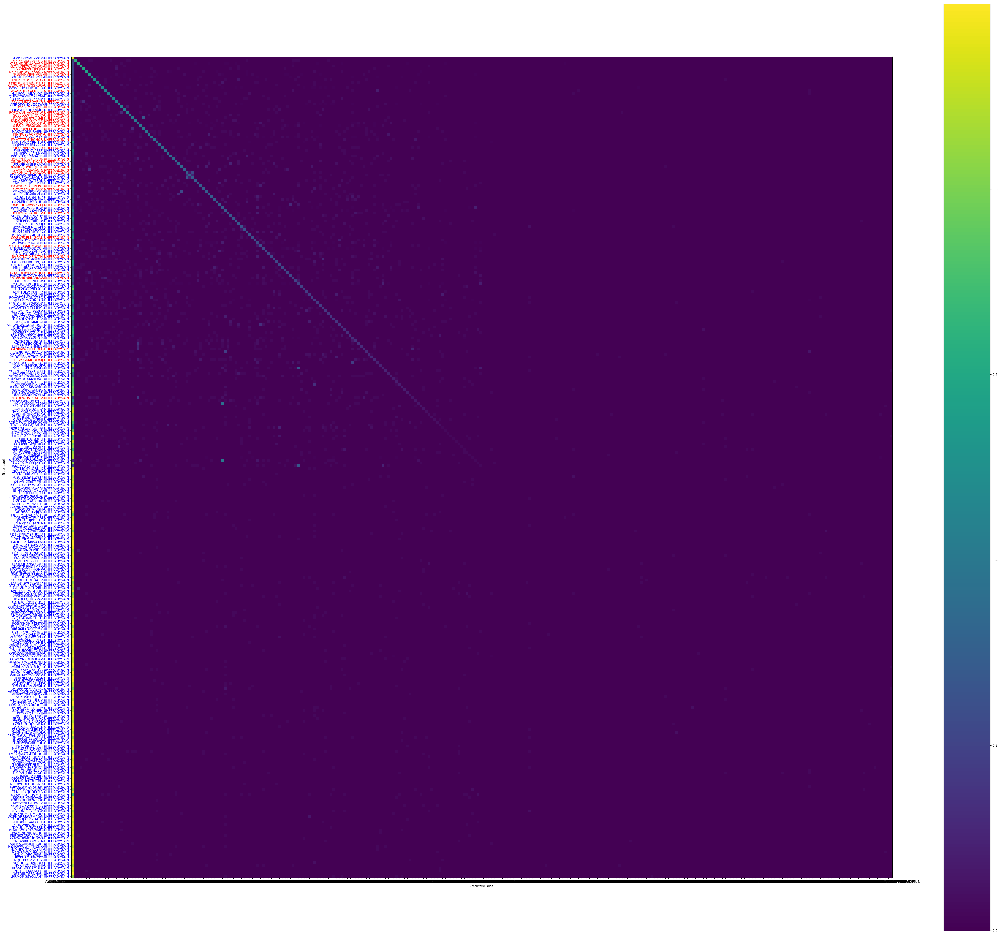

In [54]:
visualise_confusion_matrix(
    confusion_matrix=confusion_matrices_display["top_20"],
    classes=label_encoder.classes_,
    map_positive_classes=significant_drugs.values.tolist()
)

### Confusion Matrix: Top 50

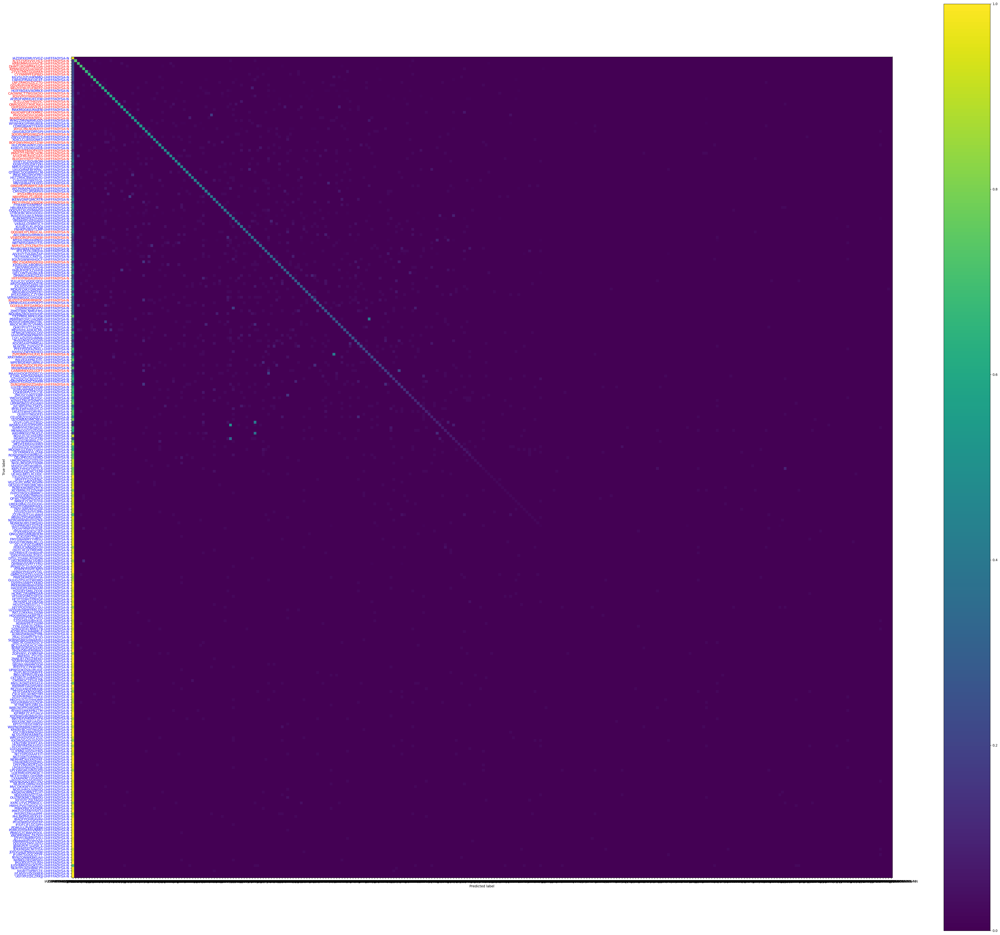

In [24]:
visualise_confusion_matrix(
    confusion_matrix=confusion_matrices_display["top_50"],
    classes=label_encoder.classes_,
    map_positive_classes=significant_drugs.values.tolist()
)

## Confusion Matrix: Top 100

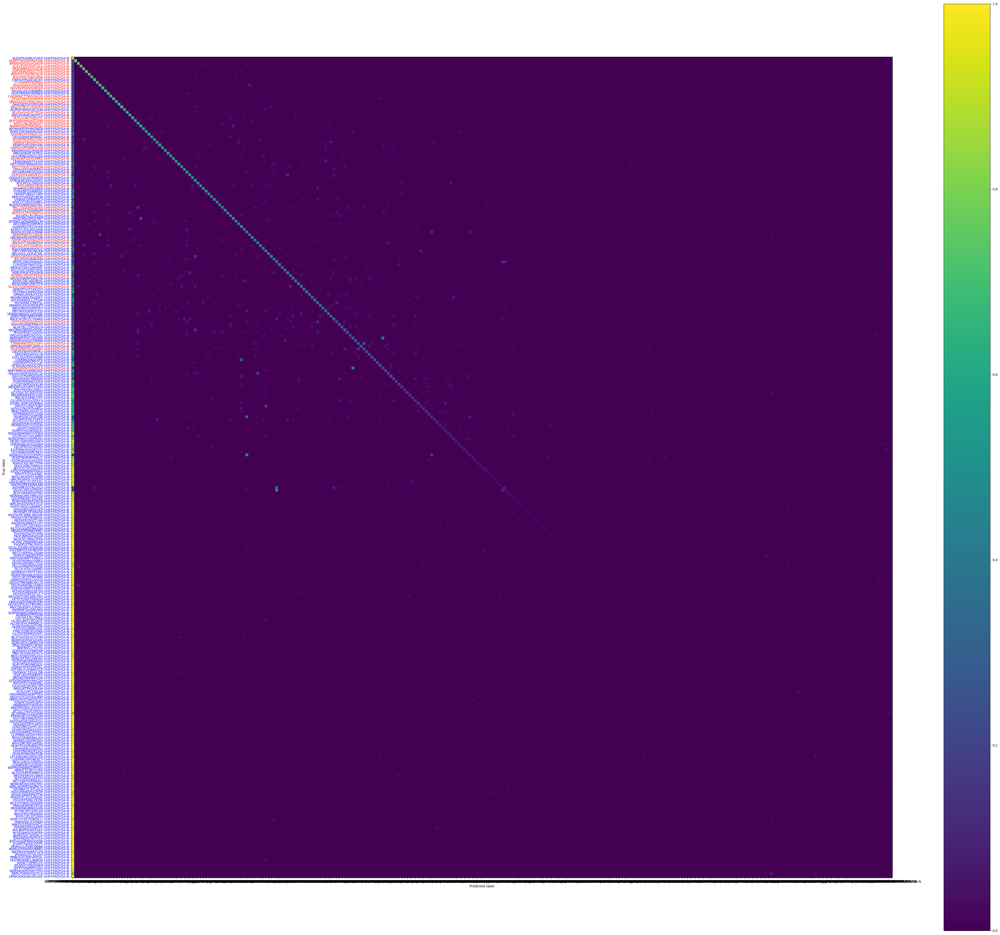

In [55]:
visualise_confusion_matrix(
    confusion_matrix=confusion_matrices_display["top_100"],
    classes=label_encoder.classes_,
    map_positive_classes=significant_drugs.values.tolist()
)

## Confusion Matrix: Top 200

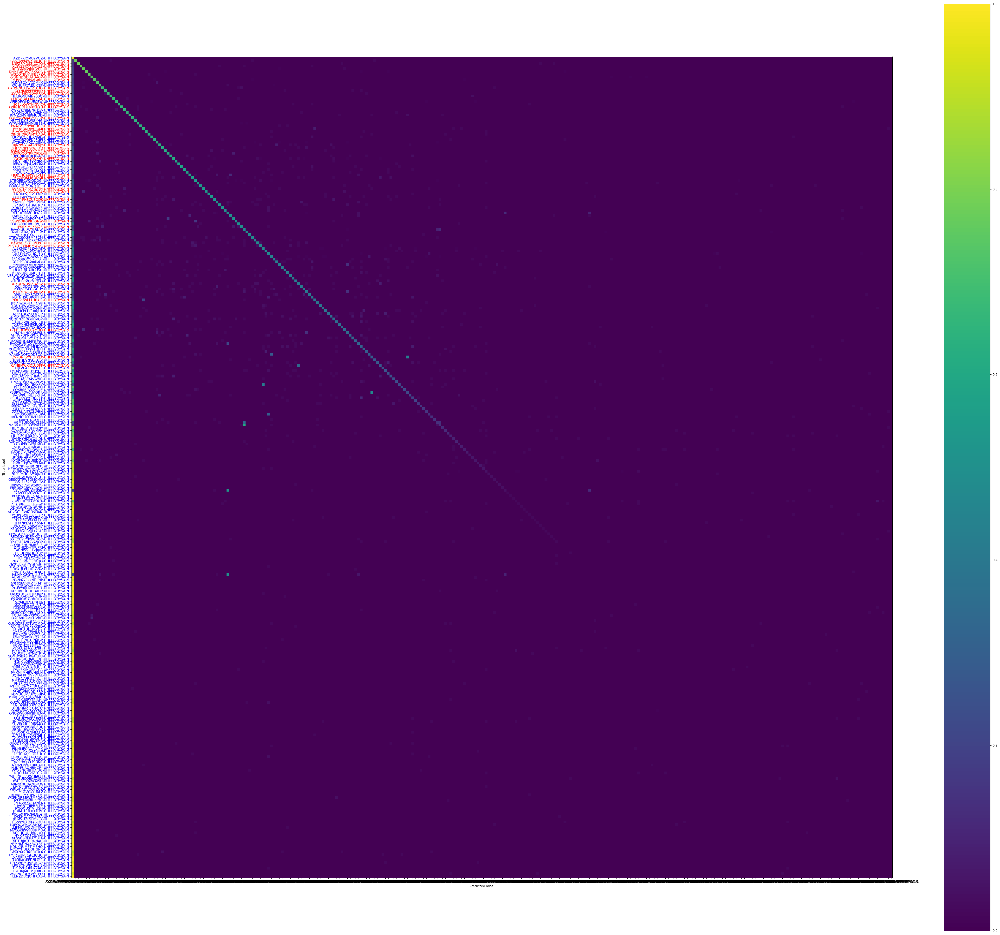

In [56]:
visualise_confusion_matrix(
    confusion_matrix=confusion_matrices_display["top_200"],
    classes=label_encoder.classes_,
    map_positive_classes=significant_drugs.values.tolist()
)

### Confusion Matrix: All

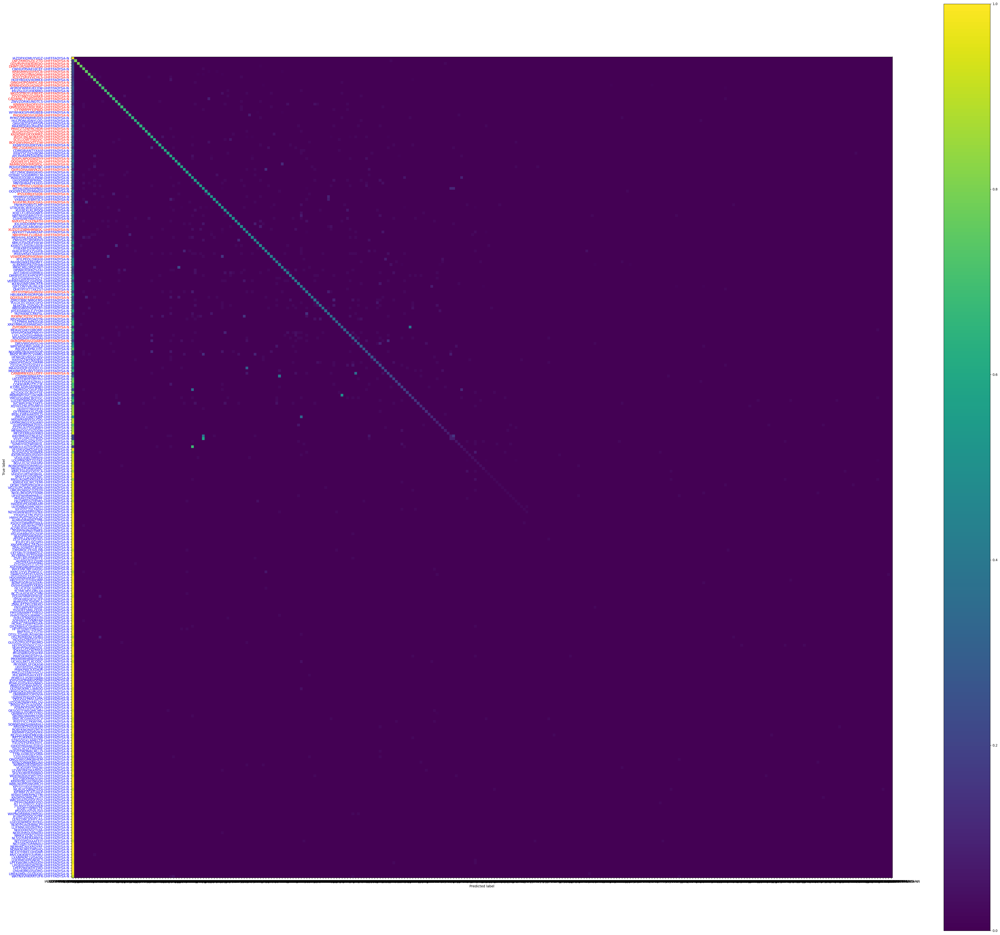

In [25]:
visualise_confusion_matrix(
    confusion_matrix=confusion_matrices_display["all"],
    classes=label_encoder.classes_,
    map_positive_classes=significant_drugs.values.tolist()
)

## Assess quality of predictions

In [48]:
def visualise_drop_in_prediction_quality(cm_reference, cm_reduced, classes, map_positive_classes):
    diagonal_reference = np.diag(cm_reference)
    diagonal_reduced = np.diag(cm_reduced)
    
    plt.figure(figsize=(6, 6))

    # draw diagonal
    min_val = min(min(diagonal_reference), min(diagonal_reduced))
    max_reference = sorted(diagonal_reference, reverse=True)[1] # skip DMSO
    max_reduced = sorted(diagonal_reduced, reverse=True)[1] # skip DMSO
    max_val = max(max_reference, max_reduced)
    plt.plot([min_val, max_val], [min_val, max_val], color='grey', linestyle='--', linewidth=2, label="Perfect Agreement")

    # draw compounds
    coloring_key = np.array([label in map_positive_classes for label in classes])
    for i, label in enumerate(classes):
        if label == "IAZDPXIOMUYVGZ-UHFFFAOYSA-N":
            # DMSO
            continue
        if coloring_key[i]:
            plt.scatter(diagonal_reference[i], diagonal_reduced[i], color='red', label='True' if i == 0 else "")
        else:
            plt.scatter(diagonal_reference[i], diagonal_reduced[i], color='blue', label='False' if i == 0 else "")

    plt.xlabel("True Predictions in Reference")
    plt.ylabel("True Predictions in Reduced")
    plt.grid(True)
    plt.show()

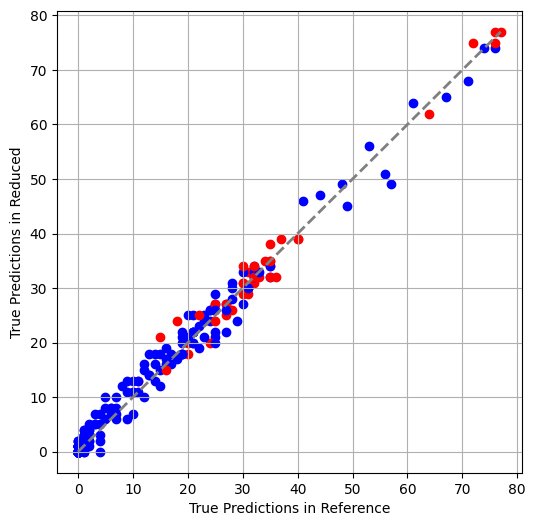

In [58]:
visualise_drop_in_prediction_quality(
    confusion_matrices["all"],
    confusion_matrices["top_200"],
    label_encoder.classes_,
    significant_drugs.values
)

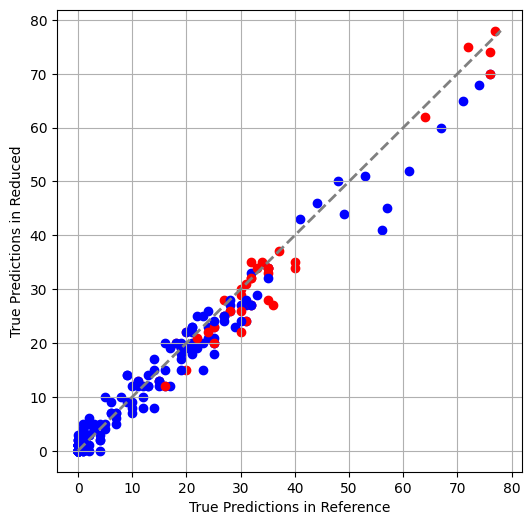

In [57]:
visualise_drop_in_prediction_quality(
    confusion_matrices["all"],
    confusion_matrices["top_100"],
    label_encoder.classes_,
    significant_drugs.values
)

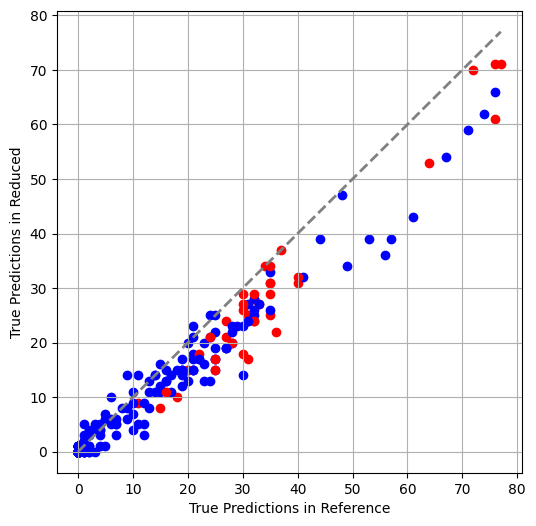

In [49]:
visualise_drop_in_prediction_quality(
    confusion_matrices["all"],
    confusion_matrices["top_50"],
    label_encoder.classes_,
    significant_drugs.values
)

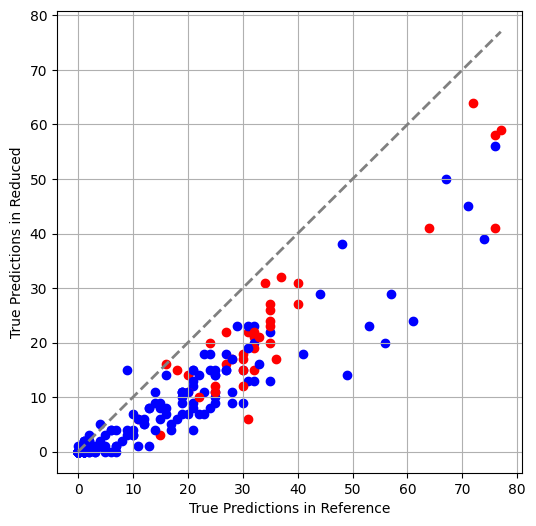

In [50]:
visualise_drop_in_prediction_quality(
    confusion_matrices["all"],
    confusion_matrices["top_20"],
    label_encoder.classes_,
    significant_drugs.values
)